In [2]:
import pandas as pd

In [48]:
HurricaneStudyData = pd.read_csv("311data.csv")
HurricaneStudyData.drop(columns = ['id','location_type','incident_address'],inplace=True)

In [4]:
HurricaneStudyData.shape

(815538, 11)

In [5]:
pd.set_option('display.max.rows',815538)

In [6]:
HurricaneStudyData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 815538 entries, 0 to 815537
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   city             815506 non-null  object 
 1   borough          815538 non-null  object 
 2   latitude         815538 non-null  float64
 3   longitude        815538 non-null  float64
 4   created_date     815538 non-null  object 
 5   closed_date      792891 non-null  object 
 6   agency           815538 non-null  object 
 7   agency_name      815538 non-null  object 
 8   complaint_type   815538 non-null  object 
 9   description      812917 non-null  object 
 10  resolution_date  804159 non-null  object 
dtypes: float64(2), object(9)
memory usage: 68.4+ MB


In [7]:
#number of unique complaint types
HurricaneStudyData['complaint_type'].nunique()

160

In [53]:
HurricaneStudyData['Service request created date'] = pd.to_datetime(HurricaneStudyData['created_date']).dt.date
HurricaneStudyData['Service request resolved date'] = pd.to_datetime(HurricaneStudyData['resolution_date']).dt.date

In [55]:


HurricaneStudyData.head()

,city,borough,latitude,longitude,created_date,closed_date,agency,agency_name,complaint_type,description,resolution_date,Service request resolved date,Service request created date
0,BROOKLYN,BROOKLYN,40.69283,-73.98623,7/1/2012 3:48,7/26/2012 12:29,TLC,Taxi and Limousine Commission,Taxi Complaint,Driver Complaint,7/26/2012 12:29,2012-07-26,2012-07-01
1,BRONX,BRONX,40.87983,-73.90414,7/2/2012 14:05,7/17/2012 12:35,DOT,Department of Transportation,Broken Muni Meter,No Receipt,7/17/2012 12:35,2012-07-17,2012-07-02
2,NEW YORK,MANHATTAN,40.73986,-73.97774,7/2/2012 15:28,7/2/2012 21:00,DEP,Department of Environmental Protection,Water System,Hydrant Running Full (WA4),7/2/2012 21:00,2012-07-02,2012-07-02
3,SUNNYSIDE,QUEENS,40.74641,-73.91898,7/2/2012 11:20,7/6/2012 0:00,DOB,Department of Buildings,Scaffold Safety,Suspended (Hanging) Scaffolds - No Pmt/Lic/Dan...,7/6/2012 0:00,2012-07-06,2012-07-02
4,NEW YORK,MANHATTAN,40.75378,-73.97372,7/2/2012 9:59,9/19/2012 0:00,DOB,Department of Buildings,Building/Use,Illegal Conversion Of Residential Building/Space,9/19/2012 0:00,2012-09-19,2012-07-02


In [56]:
HurricaneStudyData.columns

Index(['city', 'borough', 'latitude', 'longitude', 'created_date',
       'closed_date', 'agency', 'agency_name', 'complaint_type', 'description',
       'resolution_date', 'Service request resolved date',
       'Service request created date'],
      dtype='object')

In [57]:
HurricaneStudyData.isna().sum()

city                                32
borough                              0
latitude                             0
longitude                            0
created_date                         0
closed_date                      22647
agency                               0
agency_name                          0
complaint_type                       0
description                       2621
resolution_date                  11379
Service request resolved date    11379
Service request created date         0
dtype: int64

In [58]:
HurricaneStudyData['city'] = HurricaneStudyData['city'].fillna('No city specified')

In [59]:
HurricaneStudyData['city'].isna().sum()

0

In [60]:
Filtereddf = HurricaneStudyData[HurricaneStudyData['city']!= 'No city specified']

In [61]:



Filtereddf.shape


(815506, 13)

In [62]:
Filtereddf = Filtereddf[Filtereddf['Service request created date']>= pd.to_datetime('2012-10-29')]

#pd.to_datetime('2012-10-29')


C:\Users\bspho\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:73: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  result = libops.scalar_compare(x.ravel(), y, op)


In [63]:
#Which areas of New York City were most affected by Hurricane Sandy, based on the frequency and type of service requests

In [64]:
Filtereddf['complaint_type'].value_counts()

HEATING                                    70686
Damaged Tree                               33494
Noise - Residential                        21440
GENERAL CONSTRUCTION                       19829
PLUMBING                                   15073
PAINT - PLASTER                            12359
Street Light Condition                      9899
Blocked Driveway                            9034
NONCONST                                    8816
Street Condition                            8548
Traffic Signal Condition                    8277
ELECTRIC                                    6994
Sewer                                       6666
Water System                                5627
Illegal Parking                             4942
Noise                                       4462
Broken Muni Meter                           4335
General Construction/Plumbing               4308
Dirty Conditions                            3874
Consumer Complaint                          3441
Building/Use        

In [65]:
Filtereddf.groupby(by = ['city','complaint_type']).size().sort_values(ascending = False)

city                 complaint_type                         
BROOKLYN             HEATING                                    23111
BRONX                HEATING                                    21347
NEW YORK             HEATING                                    15988
BROOKLYN             Damaged Tree                                7657
                     GENERAL CONSTRUCTION                        7363
BRONX                GENERAL CONSTRUCTION                        6020
                     Noise - Residential                         5956
BROOKLYN             Noise - Residential                         5932
NEW YORK             Noise - Residential                         5863
BROOKLYN             PLUMBING                                    5720
BRONX                PLUMBING                                    4498
BROOKLYN             PAINT - PLASTER                             4441
STATEN ISLAND        Damaged Tree                                4134
BRONX                PAINT - 

In [66]:

#Which areas of New York City were most affected by Hurricane Sandy, based on the frequency and type of service requests?

Filtereddf.groupby(by = ['city','complaint_type']).size().sort_values(ascending = False).head(10)

city      complaint_type      
BROOKLYN  HEATING                 23111
BRONX     HEATING                 21347
NEW YORK  HEATING                 15988
BROOKLYN  Damaged Tree             7657
          GENERAL CONSTRUCTION     7363
BRONX     GENERAL CONSTRUCTION     6020
          Noise - Residential      5956
BROOKLYN  Noise - Residential      5932
NEW YORK  Noise - Residential      5863
BROOKLYN  PLUMBING                 5720
dtype: int64

In [67]:
Filtereddf.groupby(by = ['borough','complaint_type']).size().sort_values(ascending = False).head(10)

borough    complaint_type      
BROOKLYN   HEATING                 23111
BRONX      HEATING                 21347
QUEENS     Damaged Tree            18907
MANHATTAN  HEATING                 15988
QUEENS     HEATING                  9448
BROOKLYN   Damaged Tree             7657
           GENERAL CONSTRUCTION     7363
BRONX      GENERAL CONSTRUCTION     6020
           Noise - Residential      5956
BROOKLYN   Noise - Residential      5932
dtype: int64

In [68]:


start_date_before = pd.Timestamp('2012-09-28')
end_date_before = pd.Timestamp('2012-10-28')
start_date_after = pd.Timestamp('2012-10-29')
end_date_after = pd.Timestamp('2012-11-29')

#pd.Timestamp(start_date_before)
ServiceRequestsBefore = HurricaneStudyData[(HurricaneStudyData['Service request created date'] >= start_date_before) & (HurricaneStudyData['Service request created date'] <= end_date_before)]
ServiceRequestsBefore.head()

C:\Users\bspho\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:73: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  result = libops.scalar_compare(x.ravel(), y, op)


,city,borough,latitude,longitude,created_date,closed_date,agency,agency_name,complaint_type,description,resolution_date,Service request resolved date,Service request created date
759,BROOKLYN,BROOKLYN,40.66592,-73.88211,9/28/2012 16:00,9/28/2012 17:40,NYPD,New York City Police Department,Blocked Driveway,Partial Access,9/28/2012 17:40,2012-09-28,2012-09-28
760,BRONX,BRONX,40.85234,-73.90987,9/28/2012 15:06,10/11/2012 0:00,DSNY,Department of Sanitation,Graffiti,Graffiti,11/8/2012 10:12,2012-11-08,2012-09-28
761,BROOKLYN,BROOKLYN,40.63461,-73.96411,9/28/2012 0:00,10/3/2012 0:00,HPD,Department of Housing Preservation and Develop...,PAINT - PLASTER,WALLS,10/3/2012 0:00,2012-10-03,2012-09-28
762,NEW YORK,MANHATTAN,40.75404,-73.97205,9/28/2012 21:47,9/28/2012 23:48,NYPD,New York City Police Department,Noise - Commercial,Banging/Pounding,9/28/2012 23:48,2012-09-28,2012-09-28
763,BROOKLYN,BROOKLYN,40.64243,-73.98929,9/28/2012 16:08,7/30/2013 0:00,DOB,Department of Buildings,Building/Use,Illegal Conversion Of Residential Building/Space,7/30/2013 0:00,2013-07-30,2012-09-28


In [70]:
#To count Service requests after hurricane 
ServiceRequestsAfter = HurricaneStudyData[(HurricaneStudyData['Service request created date'] >= start_date_after) & (HurricaneStudyData['Service request created date'] <= end_date_after)]

C:\Users\bspho\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:73: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  result = libops.scalar_compare(x.ravel(), y, op)


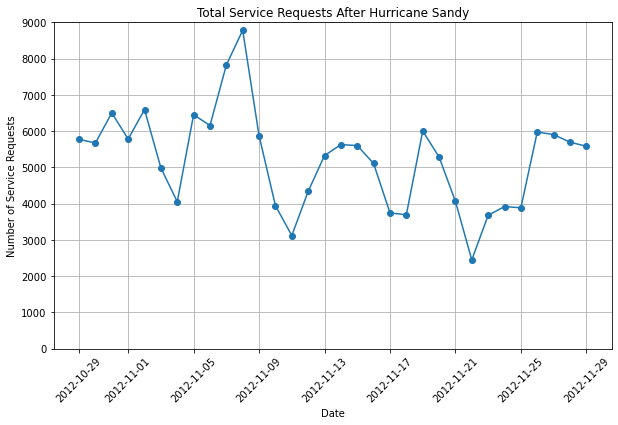

In [24]:
import matplotlib.pyplot as plt

service_requests_by_day = ServiceRequestsAfter["Service request created date"].value_counts().sort_index()
# Create line chart
plt.figure(figsize=(10, 6))
plt.plot(service_requests_by_day.index, service_requests_by_day.values, marker="o")
plt.xlabel("Date")
plt.ylabel("Number of Service Requests")
plt.title("Total Service Requests After Hurricane Sandy")
plt.xticks(rotation=45)
plt.grid(True)
plt.ylim(0, 9000)
plt.show()


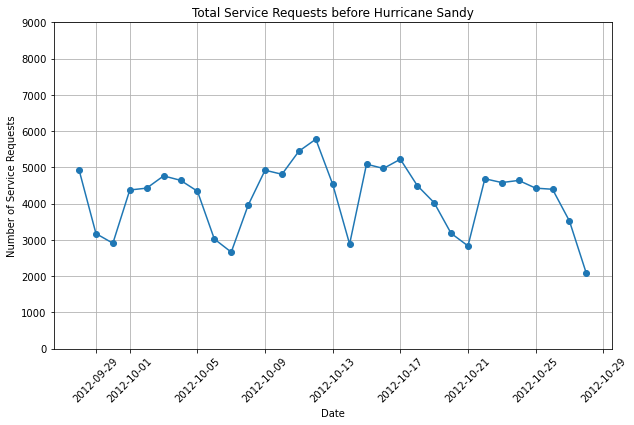

In [25]:
service_requests_by_day = ServiceRequestsBefore["Service request created date"].value_counts().sort_index()
# Create line chart
plt.figure(figsize=(10, 6))
plt.plot(service_requests_by_day.index, service_requests_by_day.values, marker="o")
plt.xlabel("Date")
plt.ylabel("Number of Service Requests")
plt.title("Total Service Requests before Hurricane Sandy")
plt.xticks(rotation=45)
plt.grid(True)
plt.ylim(0, 9000)
plt.show()


In [26]:
ServiceRequestsAfter.head()

,city,borough,latitude,longitude,created_date,closed_date,agency,agency_name,complaint_type,description,resolution_date,Service request created date
1005,JAMAICA,QUEENS,40.71850,-73.80243,10/29/2012 17:04,11/1/2012 12:09,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,11/1/2012 12:09,2012-10-29
1006,BROOKLYN,BROOKLYN,40.69435,-73.96906,10/30/2012 13:04,10/31/2012 9:04,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,10/31/2012 9:04,2012-10-30
1007,BRONX,BRONX,40.85347,-73.78883,10/30/2012 11:52,10/31/2012 12:10,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,10/31/2012 12:09,2012-10-30
1008,Kew Gardens,QUEENS,40.70832,-73.83237,10/29/2012 19:58,1/17/2013 9:39,DOT,Department of Transportation,Street Light Condition,Lamppost Knocked Down,12/4/2012 14:28,2012-10-29
1009,FOREST HILLS,QUEENS,40.71062,-73.84270,10/29/2012 20:45,11/1/2012 13:49,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,11/1/2012 13:49,2012-10-29


In [27]:
total_requests_before = len(ServiceRequestsBefore)
total_requests_after = len(ServiceRequestsAfter)

In [28]:
total_requests_before


129695

In [29]:
total_requests_after

167359

In [30]:
import scipy.stats as stats
t_statistic, p_value = stats.ttest_ind(total_requests_before, total_requests_after, equal_var=False)

C:\Users\bspho\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3723: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\bspho\anaconda3\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [31]:
if p_value < 0.05:
    print("There was a statistically significant increase in service requests after Hurricane Sandy.")
else:
    print("There was no statistically significant increase in service requests after Hurricane Sandy.")


There was no statistically significant increase in service requests after Hurricane Sandy.


In [32]:
ServiceRequestsAfter.head()

,city,borough,latitude,longitude,created_date,closed_date,agency,agency_name,complaint_type,description,resolution_date,Service request created date
1005,JAMAICA,QUEENS,40.71850,-73.80243,10/29/2012 17:04,11/1/2012 12:09,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,11/1/2012 12:09,2012-10-29
1006,BROOKLYN,BROOKLYN,40.69435,-73.96906,10/30/2012 13:04,10/31/2012 9:04,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,10/31/2012 9:04,2012-10-30
1007,BRONX,BRONX,40.85347,-73.78883,10/30/2012 11:52,10/31/2012 12:10,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,10/31/2012 12:09,2012-10-30
1008,Kew Gardens,QUEENS,40.70832,-73.83237,10/29/2012 19:58,1/17/2013 9:39,DOT,Department of Transportation,Street Light Condition,Lamppost Knocked Down,12/4/2012 14:28,2012-10-29
1009,FOREST HILLS,QUEENS,40.71062,-73.84270,10/29/2012 20:45,11/1/2012 13:49,DPR,Department of Parks and Recreation,Damaged Tree,Entire Tree Has Fallen Down,11/1/2012 13:49,2012-10-29


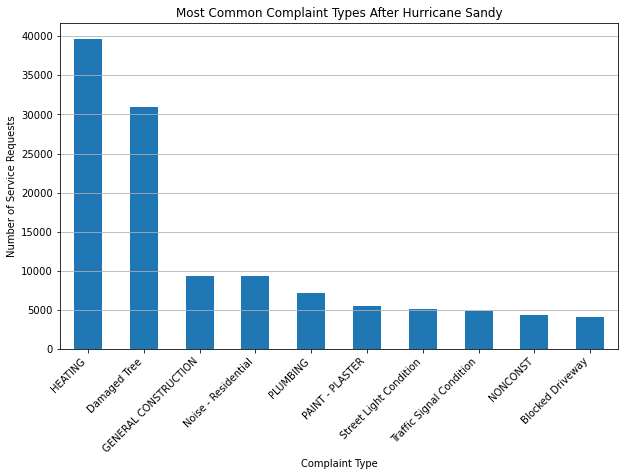

In [33]:
top_complaint_types = ServiceRequestsAfter["complaint_type"].value_counts().nlargest(10)
# Create bar chart
plt.figure(figsize=(10, 6))
top_complaint_types.plot(kind="bar")
plt.xlabel("Complaint Type")
plt.ylabel("Number of Service Requests")
plt.title("Most Common Complaint Types After Hurricane Sandy")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y")
plt.show()


In [34]:

#pythonCopy code
# including columns 'complaint_type' and 'borough'
# Create a contingency table of complaint types and boroughs
contingency_table = pd.crosstab(ServiceRequestsAfter["complaint_type"], ServiceRequestsAfter["borough"])
# Perform chi-square test
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
# Check if the chi-square test result is statistically significant
if p < 0.05:
    print("There is a statistically significant association between complaint types and boroughs.")
else:
    print("There is no statistically significant association between complaint types and boroughs.")


There is a statistically significant association between complaint types and boroughs.


In [ ]:
#Which agencies received the highest service requests after the hurricane (again, consider a one-month timeframe)? You can plot the top 10 agencies on a bar chart

In [ ]:
Agencies = ServiceRequestsAfter.groupby(by = 'agency_name').size().reset_index(name = 'Number of Service Requests').sort_values(by = 'Number of Service Requests',ascending = False).head(10)

In [ ]:
Agencies.plot(kind = 'bar',x ='agency_name',y = 'Number of Service Requests',title = 'Agencies with highest number of service requests')

In [ ]:
#Service requests after hurricane sandy grouped according to city and complaint type 
ServiceRequestsAfter.groupby(by = ['city','complaint_type']).size().sort_values(ascending = False).head(5)

In [ ]:
#Service requests after hurricane sandy grouped according to borough and complaint type 
ServiceRequestsAfter.groupby(by = ['borough','complaint_type']).size().sort_values(ascending = False).head(5)

In [ ]:
#Number of complaints before Hurricane sandy in each category
PreSandySR = ServiceRequestsBefore['complaint_type'].value_counts()
PreSandySR = PreSandySR.rename_axis('Service Request Type').reset_index(name='Before Hurricane')
PreSandySR

In [ ]:
#Number of complaints after Hurricane sandy in each category
PostSandySR = ServiceRequestsAfter['complaint_type'].value_counts()
PostSandySR = PostSandySR.rename_axis('Service Request Type').reset_index(name='After Hurricane')
PostSandySR

In [ ]:
CombinedSandyData = PostSandySR.head().merge(PreSandySR,on = 'Service Request Type')
CombinedSandyData

In [ ]:
#Change in service requests count before and after hurricane sandy 
CombinedSandyData['Difference'] = CombinedSandyData['After Hurricane'] - CombinedSandyData['Before Hurricane']
CombinedSandyData

In [ ]:
# Plotting the bar plot with positive and negative axes
plt.figure(figsize=(10, 6))

colors = ['green' if diff > 0 else 'red' for diff in CombinedSandyData['Difference']]

# Plotting the bars
plt.bar(CombinedSandyData['Service Request Type'], CombinedSandyData['Difference'], color=colors)
plt.axhline(y=0, color='black', linewidth=0.5)

# Customize the plot
plt.title('Difference After Hurricane vs. Before Hurricane')
plt.xlabel('Service Request Type')
plt.ylabel('Difference')
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()

COVID DATA ANALYSIS

In [73]:
import requests
import pandas as pd

# Retrieve the dataset
df = pd.read_csv("311_Service_Requests_from_2010_to_Present (1).csv")


C:\Users\bspho\AppData\Local\Temp\ipykernel_22668\3740304386.py:5: DtypeWarning: Columns (31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:\Users\bspho\Documents\Semester 3\Advanced business analytics\311_Service_Requests_from_2010_to_Present (1).csv")


In [74]:
df.head()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location,Zip Codes,Community Districts,Borough Boundaries,City Council Districts,Police Precincts
0,46340710,05/30/2020 11:59:57 PM,05/31/2020 02:37:38 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11379.0,64-19 62 AVENUE,...,NaN,NaN,40.714465,-73.897742,"(40.71446525967824, -73.89774208767983)",15309.0,54.0,3.0,34.0,62.0
1,46343823,05/30/2020 11:59:57 PM,06/22/2020 08:46:55 AM,HPD,Department of Housing Preservation and Develop...,UNSANITARY CONDITION,GARBAGE/RECYCLING STORAGE,RESIDENTIAL BUILDING,11214.0,8313 19 AVENUE,...,NaN,NaN,40.607519,-73.998797,"(40.607519182408986, -73.99879711365132)",17616.0,1.0,2.0,45.0,37.0
2,46343297,05/30/2020 11:59:45 PM,05/31/2020 12:09:45 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11221.0,558 HART STREET,...,NaN,NaN,40.696788,-73.929461,"(40.696788073740215, -73.92946118945981)",18181.0,42.0,2.0,30.0,53.0
3,46338204,05/30/2020 11:59:42 PM,05/31/2020 12:23:30 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10460.0,908 EAST 181 STREET,...,NaN,NaN,40.845585,-73.881449,"(40.845584953452686, -73.88144945166297)",11269.0,35.0,5.0,43.0,31.0
4,46345410,05/30/2020 11:59:40 PM,05/31/2020 12:11:59 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,10467.0,3500 TRYON AVENUE,...,NaN,NaN,40.880493,-73.876693,"(40.88049255784894, -73.87669332048401)",11605.0,24.0,5.0,40.0,34.0


In [75]:
df.shape

(933512, 46)

In [76]:
df.columns

Index(['Unique Key', 'Created Date', 'Closed Date', 'Agency', 'Agency Name',
       'Complaint Type', 'Descriptor', 'Location Type', 'Incident Zip',
       'Incident Address', 'Street Name', 'Cross Street 1', 'Cross Street 2',
       'Intersection Street 1', 'Intersection Street 2', 'Address Type',
       'City', 'Landmark', 'Facility Type', 'Status', 'Due Date',
       'Resolution Description', 'Resolution Action Updated Date',
       'Community Board', 'BBL', 'Borough', 'X Coordinate (State Plane)',
       'Y Coordinate (State Plane)', 'Open Data Channel Type',
       'Park Facility Name', 'Park Borough', 'Vehicle Type',
       'Taxi Company Borough', 'Taxi Pick Up Location', 'Bridge Highway Name',
       'Bridge Highway Direction', 'Road Ramp', 'Bridge Highway Segment',
       'Latitude', 'Longitude', 'Location', 'Zip Codes', 'Community Districts',
       'Borough Boundaries', 'City Council Districts', 'Police Precincts'],
      dtype='object')

In [77]:
df.isnull().sum()

Unique Key                             0
Created Date                           0
Closed Date                        17435
Agency                                 0
Agency Name                            0
Complaint Type                         0
Descriptor                         16975
Location Type                     223032
Incident Zip                       25342
Incident Address                   55469
Street Name                        55513
Cross Street 1                    242647
Cross Street 2                    243697
Intersection Street 1             400449
Intersection Street 2             400489
Address Type                      475041
City                               58884
Landmark                          475833
Facility Type                     910789
Status                                 0
Due Date                          929696
Resolution Description             99235
Resolution Action Updated Date      6774
Community Board                     9651
BBL             

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 933512 entries, 0 to 933511
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Unique Key                      933512 non-null  int64  
 1   Created Date                    933512 non-null  object 
 2   Closed Date                     916077 non-null  object 
 3   Agency                          933512 non-null  object 
 4   Agency Name                     933512 non-null  object 
 5   Complaint Type                  933512 non-null  object 
 6   Descriptor                      916537 non-null  object 
 7   Location Type                   710480 non-null  object 
 8   Incident Zip                    908170 non-null  float64
 9   Incident Address                878043 non-null  object 
 10  Street Name                     877999 non-null  object 
 11  Cross Street 1                  690865 non-null  object 
 12  Cross Street 2  

In [80]:
#Number of complaints in covid related data
df['Complaint Type'].nunique()

181

In [81]:

df['Service request created date'] = pd.to_datetime(df['Created Date'])

In [82]:
df['Service request created date'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 933512 entries, 0 to 933511
Series name: Service request created date
Non-Null Count   Dtype         
--------------   -----         
933512 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 7.1 MB


In [83]:
df['Service request created date'].head()

0   2020-05-30 23:59:57
1   2020-05-30 23:59:57
2   2020-05-30 23:59:45
3   2020-05-30 23:59:42
4   2020-05-30 23:59:40
Name: Service request created date, dtype: datetime64[ns]

In [84]:
startdate = "2020-05-30 00:00:00"
df[df['Service request created date']>= startdate]

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Bridge Highway Segment,Latitude,Longitude,Location,Zip Codes,Community Districts,Borough Boundaries,City Council Districts,Police Precincts,Service request created date
0,46340710,05/30/2020 11:59:57 PM,05/31/2020 02:37:38 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11379.0,64-19 62 AVENUE,...,NaN,40.714465,-73.897742,"(40.71446525967824, -73.89774208767983)",15309.0,54.0,3.0,34.0,62.0,2020-05-30 23:59:57
1,46343823,05/30/2020 11:59:57 PM,06/22/2020 08:46:55 AM,HPD,Department of Housing Preservation and Develop...,UNSANITARY CONDITION,GARBAGE/RECYCLING STORAGE,RESIDENTIAL BUILDING,11214.0,8313 19 AVENUE,...,NaN,40.607519,-73.998797,"(40.607519182408986, -73.99879711365132)",17616.0,1.0,2.0,45.0,37.0,2020-05-30 23:59:57
2,46343297,05/30/2020 11:59:45 PM,05/31/2020 12:09:45 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11221.0,558 HART STREET,...,NaN,40.696788,-73.929461,"(40.696788073740215, -73.92946118945981)",18181.0,42.0,2.0,30.0,53.0,2020-05-30 23:59:45
3,46338204,05/30/2020 11:59:42 PM,05/31/2020 12:23:30 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10460.0,908 EAST 181 STREET,...,NaN,40.845585,-73.881449,"(40.845584953452686, -73.88144945166297)",11269.0,35.0,5.0,43.0,31.0,2020-05-30 23:59:42
4,46345410,05/30/2020 11:59:40 PM,05/31/2020 12:11:59 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,10467.0,3500 TRYON AVENUE,...,NaN,40.880493,-73.876693,"(40.88049255784894, -73.87669332048401)",11605.0,24.0,5.0,40.0,34.0,2020-05-30 23:59:40
5,46339780,05/30/2020 11:59:39 PM,05/31/2020 12:15:01 AM,NYPD,New York City Police Department,Non-Emergency Police Matter,Social Distancing,Residential Building/House,10468.0,2600 CRESTON AVENUE,...,NaN,40.865158,-73.896469,"(40.865158168593744, -73.89646913260533)",11606.0,24.0,5.0,29.0,34.0,2020-05-30 23:59:39
6,46336201,05/30/2020 11:59:38 PM,05/31/2020 12:17:32 AM,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11358.0,159-01 LABURNUM AVENUE,...,NaN,40.751855,-73.807836,"(40.7518547041742, -73.80783566046303)",14193.0,22.0,3.0,3.0,67.0,2020-05-30 23:59:38
7,46342870,05/30/2020 11:59:36 PM,05/31/2020 02:42:52 AM,NYPD,New York City Police Department,Non-Emergency Police Matter,Social Distancing,Residential Building/House,11369.0,93-10 DITMARS BOULEVARD,...,NaN,40.770194,-73.877161,"(40.770193822533564, -73.87716109353295)",14511.0,65.0,3.0,21.0,73.0,2020-05-30 23:59:36
8,46345031,05/30/2020 11:59:35 PM,05/31/2020 12:15:39 AM,NYPD,New York City Police Department,Noise - Commercial,Loud Talking,Store/Commercial,10451.0,830 WASHINGTON AVENUE,...,NaN,40.822359,-73.911454,"(40.82235867896774, -73.91145415137376)",10929.0,34.0,5.0,43.0,25.0,2020-05-30 23:59:35
9,46343360,05/30/2020 11:59:30 PM,05/31/2020 12:11:45 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10467.0,333 EAST MOSHOLU PARKWAY NORTH,...,NaN,40.871678,-73.880333,"(40.871677687072705, -73.88033266494286)",11605.0,24.0,5.0,40.0,34.0,2020-05-30 23:59:30


In [85]:
start_date_before = "2020-01-15 00:00:00"
end_date_before = "2020-03-14 11:59:59"
start_date_after = "2020-03-15 00:00:00"
end_date_after = "2020-05-15 11:59:59"

#pd.Timestamp(start_date_before)

#Number of covid related service requests before lockdown
CovidServiceRequestsBefore = df[(df['Service request created date'] >= start_date_before) & (df['Service request created date'] <= end_date_before)]
len(CovidServiceRequestsBefore)

366038

In [86]:
#Number of covid requests after lockdown
CovidServiceRequestsAfter = df[(df['Service request created date'] >= start_date_after) & (df['Service request created date'] <= end_date_after)]
len(CovidServiceRequestsAfter)

345556

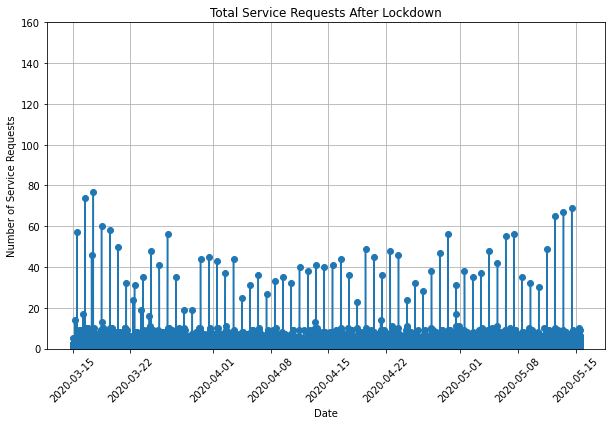

In [95]:
import matplotlib.pyplot as plt

service_requests_by_day = CovidServiceRequestsAfter["Service request created date"].value_counts().sort_index()
# Create line chart
plt.figure(figsize=(10, 6))
plt.plot(service_requests_by_day.index, service_requests_by_day.values, marker="o")
plt.xlabel("Date")
plt.ylabel("Number of Service Requests")
plt.title("Total Service Requests After Lockdown")
plt.xticks(rotation=45)
plt.grid(True)
plt.ylim(0, 160)
plt.show()

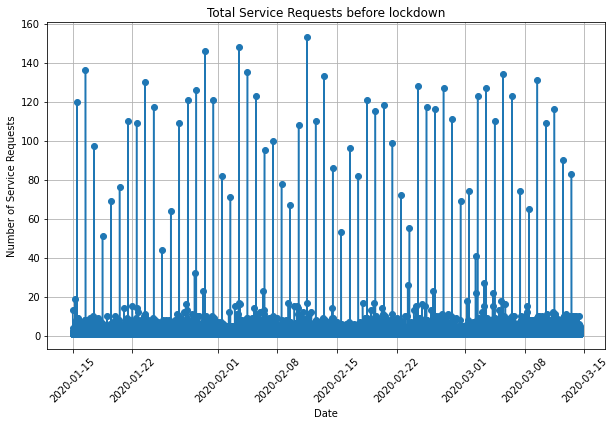

In [97]:
import matplotlib.pyplot as plt

service_requests_by_day = CovidServiceRequestsBefore["Service request created date"].value_counts().sort_index()
# Create line chart
plt.figure(figsize=(10, 6))
plt.plot(service_requests_by_day.index, service_requests_by_day.values, marker="o")
plt.xlabel("Date")
plt.ylabel("Number of Service Requests")
plt.title("Total Service Requests before lockdown")
plt.xticks(rotation=45)
plt.grid(True)
#plt.ylim(0, 100)
plt.show()

In [60]:
# Determine the most common types of COVID-19-related service requests
common_types_before = CovidServiceRequestsBefore['Complaint Type'].value_counts().head(5)
common_types_after = CovidServiceRequestsAfter['Complaint Type'].value_counts().head(5)

# Print the results
print("Most common types of COVID-19-related service requests before the lockdown:")
print(common_types_before)

print()
print("Most common types of COVID-19-related service requests after the lockdown:")
print(common_types_after)

Most common types of COVID-19-related service requests before the lockdown:
HEAT/HOT WATER                         43401
Noise - Residential                    35734
Request Large Bulky Item Collection    33424
Illegal Parking                        32295
Blocked Driveway                       21023
Name: Complaint Type, dtype: int64

Most common types of COVID-19-related service requests after the lockdown:
Noise - Residential                    57251
Non-Emergency Police Matter            39243
Request Large Bulky Item Collection    34224
HEAT/HOT WATER                         26448
Consumer Complaint                     16484
Name: Complaint Type, dtype: int64


Text(0.5, 1.0, 'Common covid requests after lockdown')

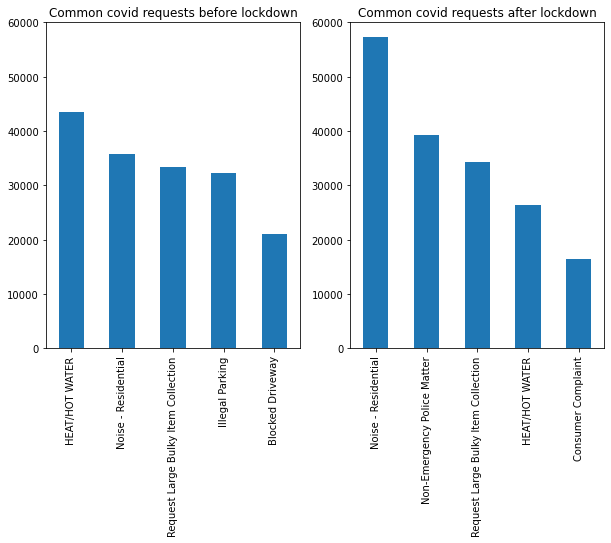

In [76]:
import matplotlib.pyplot as plt
plt.figure(figsize= (10,6))
plt.subplot(1,2,1)
common_types_before.plot(kind = 'bar')
plt.ylim(0,60000)
plt.title("Common covid requests before lockdown")
plt.subplot(1,2,2)
common_types_after.plot(kind = 'bar')
plt.ylim(0,60000)
plt.title("Common covid requests after lockdown")

<AxesSubplot:>

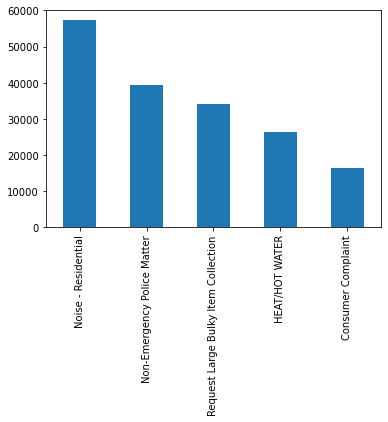

In [62]:
common_types_after.plot(kind = 'bar')

In [63]:
# Determine the areas most affected by COVID-19 based on frequency of service requests
areas_most_affected_before = CovidServiceRequestsBefore['Borough'].value_counts().head(5)
areas_most_affected_after = CovidServiceRequestsAfter['Borough'].value_counts().head(5)



In [64]:
print("Areas most affected by COVID-19 based on frequency of service requests before the lockdown:")
print(areas_most_affected_before)
print()
print("Areas most affected by COVID-19 based on frequency of service requests after the lockdown:")
print(areas_most_affected_after)


Areas most affected by COVID-19 based on frequency of service requests before the lockdown:
BROOKLYN         111895
QUEENS            92132
MANHATTAN         72631
BRONX             64837
STATEN ISLAND     20364
Name: Borough, dtype: int64

Areas most affected by COVID-19 based on frequency of service requests after the lockdown:
BROOKLYN         103395
QUEENS            79445
BRONX             70965
MANHATTAN         67289
STATEN ISLAND     16711
Name: Borough, dtype: int64


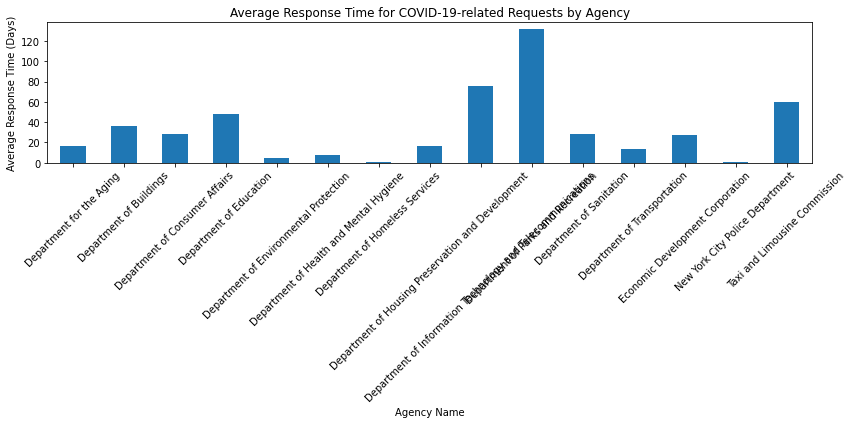

In [103]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'covid_data' is your DataFrame containing the relevant data
# including columns 'Agency Name', 'Closed Date', and 'Created Date' for COVID-19-related requests

# Convert 'Closed Date' and 'Created Date' columns to datetime data type
df['Closed Date'] = pd.to_datetime(df['Closed Date'])
df['Created Date'] = pd.to_datetime(df['Created Date'])

# Group data by agency and calculate the average response time for each agency for COVID-19-related requests
covid_agency_response_times = df.groupby("Agency Name")[["Closed Date", "Created Date"]].mean()

# Calculate the response time in days and add it as a new column
covid_agency_response_times["Response Time"] = (covid_agency_response_times["Closed Date"] - covid_agency_response_times["Created Date"]).dt.total_seconds() / (60 * 60 * 24)

# Create a bar plot to visualize the average response time for each agency
plt.figure(figsize=(12, 6))
covid_agency_response_times["Response Time"].plot(kind='bar')
plt.xlabel('Agency Name')
plt.ylabel('Average Response Time (Days)')
plt.title('Average Response Time for COVID-19-related Requests by Agency')
plt.xticks(rotation=45)
plt.tight_layout()
#plt.ylim(0,200)
plt.show()

In [65]:
# Number of complaints in each category after lockdown
grouped_data = CovidServiceRequestsAfter.groupby(["Complaint Type"]).size().reset_index(name="frequency").sort_values(by="frequency", ascending=False)
#CommonComplaints = grouped_data['Complaint Type'].head()
grouped_data



,Complaint Type,frequency
102,Noise - Residential,57251
105,Non-Emergency Police Matter,39243
124,Request Large Bulky Item Collection,34224
66,HEAT/HOT WATER,26448
27,Consumer Complaint,16484
80,Illegal Parking,16110
103,Noise - Street/Sidewalk,14043
138,Street Light Condition,11324
12,Blocked Driveway,8230
104,Noise - Vehicle,7423


In [66]:
#Number of noise residential complaints in each borough 
CovidServiceRequestsAfter[CovidServiceRequestsAfter["Complaint Type"] == "Noise - Residential"].groupby(by = "Borough").size()

Borough
BRONX            19036
BROOKLYN         14777
MANHATTAN        11947
QUEENS            9969
STATEN ISLAND     1496
Unspecified         26
dtype: int64

In [67]:
grouped_data = CovidServiceRequestsAfter.groupby(["Complaint Type"]).size().reset_index(name="frequency").sort_values(by="frequency", ascending=False)
#CommonComplaints = grouped_data['Complaint Type'].head()
grouped_data
#grouped_data[grouped_data["Complaint Type"].isin([CommonComplaints])]


,Complaint Type,frequency
102,Noise - Residential,57251
105,Non-Emergency Police Matter,39243
124,Request Large Bulky Item Collection,34224
66,HEAT/HOT WATER,26448
27,Consumer Complaint,16484
80,Illegal Parking,16110
103,Noise - Street/Sidewalk,14043
138,Street Light Condition,11324
12,Blocked Driveway,8230
104,Noise - Vehicle,7423


In [68]:
CovidServiceRequestsAfter[CovidServiceRequestsAfter["Complaint Type"] == "Non-Emergency Police Matter"].groupby(by = "Borough").size()

Borough
BRONX             6098
BROOKLYN         12937
MANHATTAN        10100
QUEENS            8277
STATEN ISLAND     1825
Unspecified          6
dtype: int64

In [69]:
CovidServiceRequestsAfter[CovidServiceRequestsAfter["Complaint Type"] == "Request Large Bulky Item Collection"].groupby(by = "Borough").size()

Borough
BRONX             2266
BROOKLYN         12402
MANHATTAN         3686
QUEENS           12411
STATEN ISLAND     3459
dtype: int64

In [70]:
CovidServiceRequestsAfter[CovidServiceRequestsAfter["Complaint Type"] == "HEAT/HOT WATER"].groupby(by = "Borough").size()

Borough
BRONX            9961
BROOKLYN         6967
MANHATTAN        6057
QUEENS           3245
STATEN ISLAND     218
dtype: int64

In [71]:
CovidServiceRequestsAfter[CovidServiceRequestsAfter["Complaint Type"] == "Noise - Street/Sidewalk"].groupby(by = "Borough").size()

Borough
BRONX            2741
BROOKLYN         4452
MANHATTAN        4995
QUEENS           1701
STATEN ISLAND     151
Unspecified         3
dtype: int64

In [72]:
#Types of complaints in each borough
grouped_data = CovidServiceRequestsAfter.groupby(["Complaint Type","Borough"]).size().reset_index(name="frequency")

# Sort the data by frequency in descending order
sorted_data = grouped_data.sort_values(by="frequency", ascending=False)

# Get the top affected areas based on frequency
top_areas = sorted_data["Borough"].unique()[:5]

# Print the top affected areas and their corresponding frequencies and complaint types
for area in top_areas:
    area_data = sorted_data[sorted_data["Borough"] == area]
    frequencies = area_data["frequency"].values
    complaint_types = area_data["Complaint Type"].values
    print(f"Area: {area}")
    for freq, comp_type in zip(frequencies, complaint_types):
        print(f"  Complaint Type: {comp_type}, Frequency: {freq}")

Area: BRONX
  Complaint Type: Noise - Residential, Frequency: 19036
  Complaint Type: HEAT/HOT WATER, Frequency: 9961
  Complaint Type: Non-Emergency Police Matter, Frequency: 6098
  Complaint Type: Consumer Complaint, Frequency: 3680
  Complaint Type: Illegal Parking, Frequency: 2790
  Complaint Type: Noise - Street/Sidewalk, Frequency: 2741
  Complaint Type: Request Large Bulky Item Collection, Frequency: 2266
  Complaint Type: UNSANITARY CONDITION, Frequency: 2156
  Complaint Type: Blocked Driveway, Frequency: 1886
  Complaint Type: Street Light Condition, Frequency: 1710
  Complaint Type: PLUMBING, Frequency: 1575
  Complaint Type: Noise - Vehicle, Frequency: 1348
  Complaint Type: PAINT/PLASTER, Frequency: 1138
  Complaint Type: Street Condition, Frequency: 984
  Complaint Type: DOOR/WINDOW, Frequency: 855
  Complaint Type: WATER LEAK, Frequency: 740
  Complaint Type: GENERAL, Frequency: 651
  Complaint Type: Rodent, Frequency: 645
  Complaint Type: ELECTRIC, Frequency: 626
  Comp

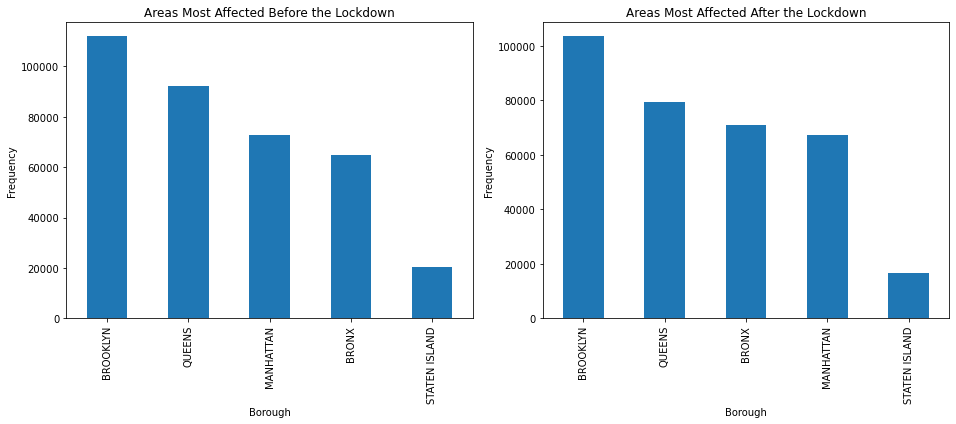

In [73]:
import matplotlib.pyplot as plt
# Plotting the graphs
plt.figure(figsize=(20, 6))

# Graph for areas most affected before the lockdown
plt.subplot(1, 3, 1)
areas_most_affected_before.plot(kind='bar')
plt.title("Areas Most Affected Before the Lockdown")
plt.xlabel("Borough")
plt.ylabel("Frequency")

# Graph for areas most affected after the lockdown
plt.subplot(1, 3, 2)
areas_most_affected_after.plot(kind='bar')
plt.title("Areas Most Affected After the Lockdown")
plt.xlabel("Borough")
plt.ylabel("Frequency")


# Adjust the spacing between subplots
plt.tight_layout()

# Display the graphs
plt.show()

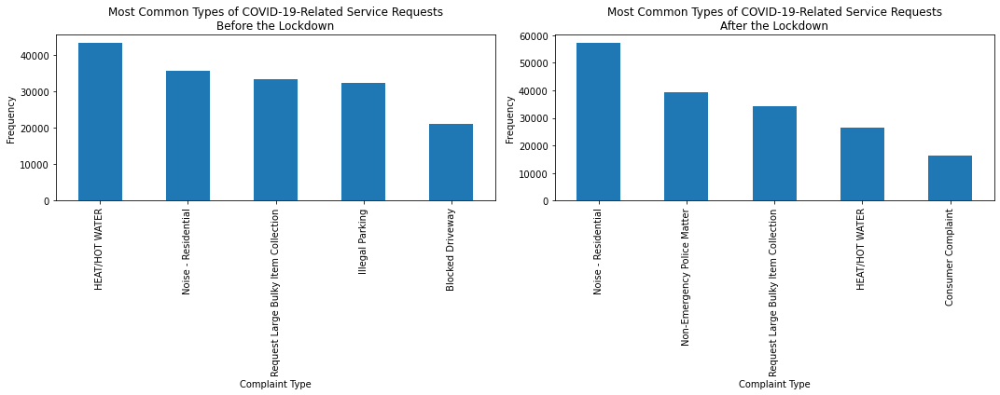

In [74]:
# Plotting the graphs
plt.figure(figsize=(15, 6))

# Graph for most common types of COVID-19-related service requests before the lockdown
plt.subplot(1, 2, 1)
common_types_before.plot(kind='bar')
plt.title("Most Common Types of COVID-19-Related Service Requests\nBefore the Lockdown")
plt.xlabel("Complaint Type")
plt.ylabel("Frequency")

# Graph for most common types of COVID-19-related service requests after the lockdown
plt.subplot(1, 2, 2)
common_types_after.plot(kind='bar')
plt.title("Most Common Types of COVID-19-Related Service Requests\nAfter the Lockdown")
plt.xlabel("Complaint Type")
plt.ylabel("Frequency")

# Adjust the spacing between subplots
plt.tight_layout()

# Display the graphs
plt.show()

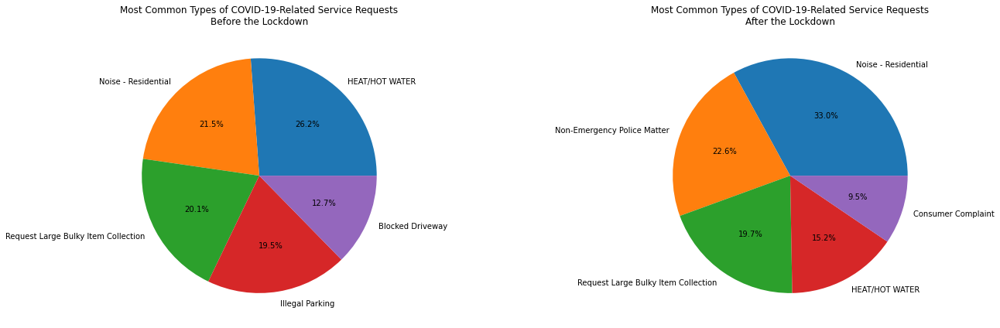

In [75]:
# Plotting the graphs using Pie Chart
plt.figure(figsize=(20, 6))

# Pie chart for most common types of COVID-19-related service requests before the lockdown
plt.subplot(1, 2, 1)
plt.pie(common_types_before.values, labels=common_types_before.index, autopct='%1.1f%%')
plt.title("Most Common Types of COVID-19-Related Service Requests\nBefore the Lockdown")

# Pie chart for most common types of COVID-19-related service requests after the lockdown
plt.subplot(1, 2, 2)
plt.pie(common_types_after.values, labels=common_types_after.index, autopct='%1.1f%%')
plt.title("Most Common Types of COVID-19-Related Service Requests\nAfter the Lockdown")

# Adjust the spacing between subplots
plt.tight_layout()

# Display the graphs
plt.show()

In [71]:
ServiceRequestsAfter =ServiceRequestsAfter[ServiceRequestsAfter['Service request created date'] <= ServiceRequestsAfter['Service request resolved date']]

In [72]:
import pandas as pd

# Assuming 'ServiceRequestsAfter' is your DataFrame containing the relevant data
# including columns 'agency_name', 'closed_date', and 'created_date' for service requests after Hurricane Sandy
# Convert 'closed_date' and 'created_date' columns to datetime format
ServiceRequestsAfter['resolution_date'] = pd.to_datetime(ServiceRequestsAfter['resolution_date'])
ServiceRequestsAfter['created_date'] = pd.to_datetime(ServiceRequestsAfter['created_date'])

# Calculate the response time in days for each service request
ServiceRequestsAfter['response_time'] = (ServiceRequestsAfter['resolution_date'] - ServiceRequestsAfter['created_date']).dt.total_seconds() / (60 * 60 * 24)

# Group data by agency and calculate the average response time for each agency
agency_response_times = ServiceRequestsAfter.groupby("agency_name")["response_time"].mean().reset_index()

# Find the agency with the shortest average response time
shortest_response_time = agency_response_times['response_time'].min()
agencies_with_shortest_response_time = agency_response_times[agency_response_times['response_time'] == shortest_response_time]

# Print the agencies with the shortest average response time
print("Agencies with the Shortest Average Response Time:")
print(agencies_with_shortest_response_time)

Agencies with the Shortest Average Response Time:
       agency_name  response_time
55  Queens West 03       0.303991
